# JTD USING CRF

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 5GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/jargon-detection/validation.csv
/kaggle/input/jargon-detection/test_no_labels.csv
/kaggle/input/jargon-detection/train.csv


> [reference link](https://www.kaggle.com/shoumikgoswami/ner-using-random-forest-and-crf)

In [2]:
#Data analysis
import pandas as pd
import numpy as np
#Data visualisation
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)
sns.set(font_scale=1)
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
#Modeling
from sklearn.model_selection import cross_val_predict, cross_val_score
from sklearn.ensemble import RandomForestClassifier
# from sklearn_crfsuite import CRF, scorers, metrics
# import sklearn_crfsuite
# from sklearn_crfsuite import scorers
# from sklearn_crfsuite import metrics
# from sklearn_crfsuite.metrics import flat_classification_report
from sklearn.metrics import classification_report, make_scorer
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
import scipy.stats
import eli5

/opt/conda/lib/python3.7/site-packages/sklearn/utils/deprecation.py:143: FutureWarning: The sklearn.metrics.scorer module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/utils/deprecation.py:143: FutureWarning: The sklearn.feature_selection.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_selection. Anything that cannot be imported from sklearn.feature_selection is now part of the private API.
  warnings.warn(message, FutureWarning)


In [3]:
!pip install sklearn-crfsuite

You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


In [4]:
from itertools import chain

import nltk
import sklearn
import scipy.stats

import sklearn_crfsuite
from sklearn_crfsuite import scorers,CRF
from sklearn_crfsuite.metrics import flat_classification_report
from sklearn_crfsuite import metrics

In [5]:
df_val = pd.read_csv('/kaggle/input/jargon-detection/validation.csv')
df_val.head(5)

,token_id,token,label
0,cs/doc_1867/0/0,Section,O
1,cs/doc_1867/0/1,~,O
2,cs/doc_1867/0/2,illustrates,O
3,cs/doc_1867/0/3,the,O
4,cs/doc_1867/0/4,proposed,O


In [6]:
df_train = pd.read_csv('/kaggle/input/jargon-detection/train.csv')
df_train.head(5)

,token_id,token,label
0,cs/doc_1/0/0,A,O
1,cs/doc_1/0/1,SHAP,O
2,cs/doc_1/0/2,summary,O
3,cs/doc_1/0/3,plot,TERM
4,cs/doc_1/0/4,shows,O


In [7]:
df_test = pd.read_csv('/kaggle/input/jargon-detection/test_no_labels.csv')
df_test.head(5)

,token_id,token,label
0,cs/doc_1977/0/0,Next,O
1,cs/doc_1977/0/1,",",O
2,cs/doc_1977/0/2,we,O
3,cs/doc_1977/0/3,analyze,O
4,cs/doc_1977/0/4,the,O


In [8]:
df_train[['m','n','x','y']] = df_train["token_id"].apply(lambda x: pd.Series(str(x).split("/")))

In [9]:
df_val[['m','n','x','y']] = df_val["token_id"].apply(lambda x: pd.Series(str(x).split("/")))

In [10]:
df_test[['m','n','x','y']] = df_test["token_id"].apply(lambda x: pd.Series(str(x).split("/")))

In [11]:
df_train.head()

,token_id,token,label,m,n,x,y
0,cs/doc_1/0/0,A,O,cs,doc_1,0,0
1,cs/doc_1/0/1,SHAP,O,cs,doc_1,0,1
2,cs/doc_1/0/2,summary,O,cs,doc_1,0,2
3,cs/doc_1/0/3,plot,TERM,cs,doc_1,0,3
4,cs/doc_1/0/4,shows,O,cs,doc_1,0,4


In [12]:
df_train = df_train.dropna() 

In [13]:
df_train[['a','b']] = df_train["n"].apply(lambda x: pd.Series(str(x).split("_")))
df_train

,token_id,token,label,m,n,x,y,a,b
0,cs/doc_1/0/0,A,O,cs,doc_1,0,0,doc,1
1,cs/doc_1/0/1,SHAP,O,cs,doc_1,0,1,doc,1
2,cs/doc_1/0/2,summary,O,cs,doc_1,0,2,doc,1
3,cs/doc_1/0/3,plot,TERM,cs,doc_1,0,3,doc,1
4,cs/doc_1/0/4,shows,O,cs,doc_1,0,4,doc,1
...,...,...,...,...,...,...,...,...,...
574905,phys/doc_1866/5/20,from,O,phys,doc_1866,5,20,doc,1866
574906,phys/doc_1866/5/21,a,O,phys,doc_1866,5,21,doc,1866
574907,phys/doc_1866/5/22,commercial,O,phys,doc_1866,5,22,doc,1866
574908,phys/doc_1866/5/23,supercapacitor,TERM,phys,doc_1866,5,23,doc,1866


In [14]:
df_val[['a','b']] = df_val["n"].apply(lambda x: pd.Series(str(x).split("_")))
df_val

,token_id,token,label,m,n,x,y,a,b
0,cs/doc_1867/0/0,Section,O,cs,doc_1867,0,0,doc,1867
1,cs/doc_1867/0/1,~,O,cs,doc_1867,0,1,doc,1867
2,cs/doc_1867/0/2,illustrates,O,cs,doc_1867,0,2,doc,1867
3,cs/doc_1867/0/3,the,O,cs,doc_1867,0,3,doc,1867
4,cs/doc_1867/0/4,proposed,O,cs,doc_1867,0,4,doc,1867
...,...,...,...,...,...,...,...,...,...
37138,phys/doc_1976/10/28,vorticity,TERM,phys,doc_1976,10,28,doc,1976
37139,phys/doc_1976/10/29,in,O,phys,doc_1976,10,29,doc,1976
37140,phys/doc_1976/10/30,the,O,phys,doc_1976,10,30,doc,1976
37141,phys/doc_1976/10/31,wake,O,phys,doc_1976,10,31,doc,1976


In [15]:
df_test[['a','b']] = df_test["n"].apply(lambda x: pd.Series(str(x).split("_")))
df_test

,token_id,token,label,m,n,x,y,a,b
0,cs/doc_1977/0/0,Next,O,cs,doc_1977,0,0,doc,1977
1,cs/doc_1977/0/1,",",O,cs,doc_1977,0,1,doc,1977
2,cs/doc_1977/0/2,we,O,cs,doc_1977,0,2,doc,1977
3,cs/doc_1977/0/3,analyze,O,cs,doc_1977,0,3,doc,1977
4,cs/doc_1977/0/4,the,O,cs,doc_1977,0,4,doc,1977
...,...,...,...,...,...,...,...,...,...
42353,phys/doc_2100/10/20,also,O,phys,doc_2100,10,20,doc,2100
42354,phys/doc_2100/10/21,presented,O,phys,doc_2100,10,21,doc,2100
42355,phys/doc_2100/10/22,and,O,phys,doc_2100,10,22,doc,2100
42356,phys/doc_2100/10/23,discussed,O,phys,doc_2100,10,23,doc,2100


In [16]:
df_val = df_val.dropna() 

In [17]:
df_test = df_test.dropna()

In [18]:
df_train = df_train.drop('y', axis=1)
df_train = df_train.drop('token_id', axis=1)
df_train = df_train.drop('n', axis=1)
df_train = df_train.drop('a', axis=1)

In [19]:
df_val = df_val.drop('y', axis=1)
df_val = df_val.drop('token_id', axis=1)
df_val = df_val.drop('n', axis=1)
df_val = df_val.drop('a', axis=1)

In [20]:
df_test = df_test.drop('y', axis=1)
df_test = df_test.drop('token_id', axis=1)
df_test = df_test.drop('n', axis=1)
df_test = df_test.drop('a', axis=1)

In [21]:
grouped = df_train.groupby(['m'])
computer_trn = grouped.get_group("cs")
physics_trn = grouped.get_group("phys")
economics_trn = grouped.get_group("econ")

In [22]:
computer_trn.shape

(163269, 5)

In [23]:
computer_trn['token'].isna().sum()

0

In [24]:
# Get a string of all the texts available
tech_trm = computer_trn.groupby(['label'])
cmpt = tech_trm.get_group('TERM')
data_text = [txt for txt in cmpt['token']]
data_text
ltr = ""
for i in data_text:
    ltr += i + " "    

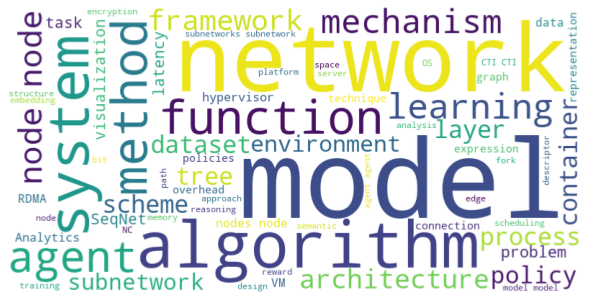

In [25]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS

stopwords = set(STOPWORDS)
wordcloud = WordCloud(width = 800, height = 400,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(ltr)
                    
plt.figure(figsize = (8, 6), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)

In [26]:
# Get a string of all the texts available
tech_trm = physics_trn.groupby(['label'])
cmpt = tech_trm.get_group('TERM')
data_text = [txt for txt in cmpt['token']]
data_text
ltr_p = ""
for i in data_text:
    ltr_p += i + " "    

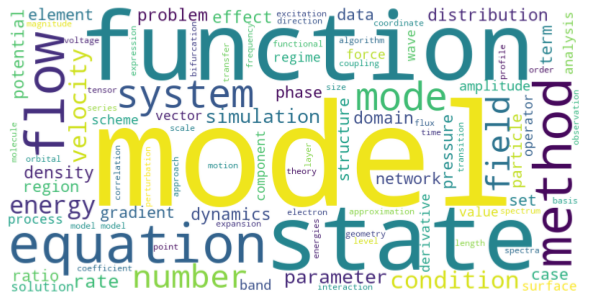

In [27]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS

stopwords = set(STOPWORDS)
wordcloud = WordCloud(width = 800, height = 400,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(ltr_p)
                    
plt.figure(figsize = (8, 6), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)

In [28]:
# Get a string of all the texts available
tech_trm = economics_trn.groupby(['label'])
cmpt = tech_trm.get_group('TERM')
data_text = [txt for txt in cmpt['token']]
data_text
ltr_e = ""
for i in data_text:
    ltr_e += i + " "

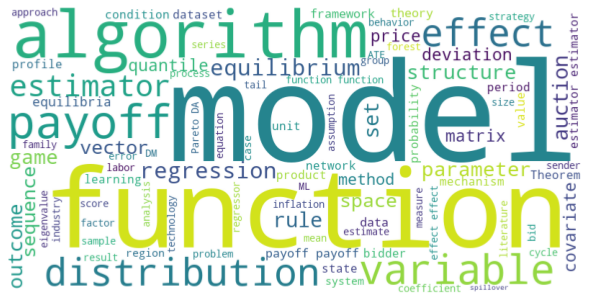

In [29]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS

stopwords = set(STOPWORDS)
wordcloud = WordCloud(width = 800, height = 400,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(ltr_e)
                    
plt.figure(figsize = (8, 6), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)

In [30]:
grouped = df_val.groupby(['m'])
computer_val = grouped.get_group("cs")
physics_val = grouped.get_group("phys")
economics_val = grouped.get_group("econ")

In [31]:
grouped = df_test.groupby(['m'])
computer_test = grouped.get_group("cs")
physics_test = grouped.get_group("phys")
economics_test = grouped.get_group("econ")

In [32]:
computer_test['token'].isna().sum()

0

In [33]:
computer_trn.x.nunique(dropna = True)

29

In [34]:
computer_val.x.nunique(dropna = True)

28

In [35]:
computer_test.x.nunique(dropna = True)

30

In [36]:
computer_test.shape

(15457, 5)

In [37]:
physics_test.shape

(13750, 5)

In [38]:
economics_test.shape

(13150, 5)

In [39]:
seq_cmp_trn = [tuple(x) for x in computer_trn.to_numpy()]
print(seq_cmp_trn[1])

('SHAP', 'O', 'cs', '0', '1')


In [40]:
seq_cmp_val = [tuple(x) for x in computer_val.to_numpy()]
print(seq_cmp_val[1])

('~', 'O', 'cs', '0', '1867')


In [41]:
seq_cmp_test = [tuple(x) for x in computer_test.to_numpy()]
print(seq_cmp_test[1])

(',', 'O', 'cs', '0', '1977')


In [42]:
computer_trn["s"] = computer_trn['x'].astype(str) + computer_trn["b"]
computer_trn

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,token,label,m,x,b,s
0,A,O,cs,0,1,01
1,SHAP,O,cs,0,1,01
2,summary,O,cs,0,1,01
3,plot,TERM,cs,0,1,01
4,shows,O,cs,0,1,01
...,...,...,...,...,...,...
163268,measure,O,cs,11,99,1199
163269,of,O,cs,11,99,1199
163270,disclosure,O,cs,11,99,1199
163271,risk,TERM,cs,11,99,1199


In [43]:
computer_val["s"] = computer_val['x'].astype(str) + computer_val["b"]
computer_val

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,token,label,m,x,b,s
0,Section,O,cs,0,1867,01867
1,~,O,cs,0,1867,01867
2,illustrates,O,cs,0,1867,01867
3,the,O,cs,0,1867,01867
4,proposed,O,cs,0,1867,01867
...,...,...,...,...,...,...
14113,file,O,cs,12,1910,121910
14114,descriptor,TERM,cs,12,1910,121910
14115,),O,cs,12,1910,121910
14116,.,O,cs,12,1910,121910


In [44]:
computer_test["s"] = computer_test['x'].astype(str) + computer_test["b"]
computer_test

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,token,label,m,x,b,s
0,Next,O,cs,0,1977,01977
1,",",O,cs,0,1977,01977
2,we,O,cs,0,1977,01977
3,analyze,O,cs,0,1977,01977
4,the,O,cs,0,1977,01977
...,...,...,...,...,...,...
15452,',O,cs,12,2019,122019
15453,',O,cs,12,2019,122019
15454,of,O,cs,12,2019,122019
15455,memory,O,cs,12,2019,122019


In [45]:
computer_trn = computer_trn.drop('x', axis=1)
computer_trn = computer_trn.drop('b', axis=1)
computer_trn = computer_trn.drop('m', axis=1)

In [46]:
computer_val = computer_val.drop('x', axis=1)
computer_val = computer_val.drop('b', axis=1)
computer_val = computer_val.drop('m', axis=1)

In [47]:
computer_test = computer_test.drop('x', axis=1)
computer_test = computer_test.drop('b', axis=1)
computer_test = computer_test.drop('m', axis=1)

In [48]:
computer_trn.s.nunique(dropna = True)

6381

In [49]:
computer_val.s.nunique(dropna = True)

554

In [50]:
computer_test.s.nunique(dropna = True)

571

In [51]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

In [52]:
label_cmp_trn = le.fit_transform(computer_trn['s'])
computer_trn['s'] = label_cmp_trn

In [53]:
label_cmp_val = le.fit_transform(computer_val['s'])
computer_val['s'] = label_cmp_val

In [54]:
label_cmp_tst = le.fit_transform(computer_test['s'])
computer_test['s'] = label_cmp_tst

In [55]:
seq_trn_cmp = [tuple(x) for x in computer_trn.to_numpy()]
#print(seq_trn)

In [56]:
seq_val_cmp = [tuple(x) for x in computer_val.to_numpy()]
#print(seq_val)

In [57]:
seq_tst_cmp = [tuple(x) for x in computer_test.to_numpy()]
#print(seq_val)

In [58]:
computer_trn = computer_trn.dropna() 
computer_trn.s.nunique(dropna = True)

6381

In [59]:
computer_val = computer_val.dropna() 
computer_val.s.nunique(dropna = True)

554

In [60]:
computer_test = computer_test.dropna() 
computer_test.s.nunique(dropna = True)

571

In [61]:
lst_t_cmp = [[] for i in range(6381)]
for i in seq_trn_cmp:
    lst_t_cmp[int(i[2])].append(i)
print(lst_t_cmp[0]) 

[('A', 'O', 0), ('SHAP', 'O', 0), ('summary', 'O', 0), ('plot', 'TERM', 0), ('shows', 'O', 0), ('the', 'O', 0), ('SHAP', 'O', 0), ('value', 'TERM', 0), ('of', 'O', 0), ('features', 'O', 0), ('for', 'O', 0), ('individual', 'O', 0), ('data', 'O', 0), ('points', 'O', 0), ('.', 'O', 0)]


In [62]:
lst_v_cmp = [[] for i in range(6381)]
for i in seq_val_cmp:
    lst_v_cmp[int(i[2])].append(i)
print(lst_v_cmp[0])

[('Section', 'O', 0), ('~', 'O', 0), ('illustrates', 'O', 0), ('the', 'O', 0), ('proposed', 'O', 0), ('tilted', 'O', 0), ('layer', 'O', 0), ('fusion', 'O', 0), ('method', 'TERM', 0), ('.', 'O', 0)]


In [63]:
lst_s_cmp = [[] for i in range(6381)]
for i in seq_tst_cmp:
    lst_s_cmp[int(i[2])].append(i)
print(lst_s_cmp[0])

[('Next', 'O', 0), (',', 'O', 0), ('we', 'O', 0), ('analyze', 'O', 0), ('the', 'O', 0), ('query', 'O', 0), ('frequency', 'O', 0), ('burst', 'O', 0), ('(', 'O', 0), ('cf.', 'O', 0), ('Figure', 'O', 0), (')', 'O', 0), ('.', 'O', 0)]


In [64]:
%%time
train_sents_cmp = list(lst_t_cmp)
val_sents_cmp = list(lst_v_cmp)
test_sent_cmp = list(lst_s_cmp)

CPU times: user 184 µs, sys: 2 µs, total: 186 µs
Wall time: 198 µs


In [65]:
import re
pattern = r'[!@#$%^&*(),.?":{}|<>]'

def word2features(sent, i):
    word = sent[i][0]
    
    features = {
        'bias': 1.0,
        'word.lower()': word.lower(),
        'word[-3:]': word[-3:],
        'word[-2:]': word[-2:],
         'word[:]': word[-2:],
        'word.isupper()': word.isupper(),
        'word.istitle()': word.istitle(),
        'word.isdigit()': word.isdigit(),
#         'word.isspecial()': re.search(pattern, str(word)) != None,
#         'word.isalpha()':word.isalpha(),
#         'word.':word.isidentifier()

    }
    if i > 0:
        word1 = sent[i-1][0]
       
        features.update({
            '-1:word.lower()': word1.lower(),
            '-1:word.istitle()': word1.istitle(),
            '-1:word.isupper()': word1.isupper(),
        })
    else:
        features['BOS'] = True
        
    if i < len(sent)-1:
        word1 = sent[i+1][0]

        features.update({
            '+1:word.lower()': word1.lower(),
            '+1:word.istitle()': word1.istitle(),
            '+1:word.isupper()': word1.isupper(),
        })
    else:
        features['EOS'] = True
                
    return features


def sent2features(sent):
    return [word2features(sent, i) for i in range(len(sent))]

def sent2labels(sent):
    return [label for token, label,x in sent]



In [66]:
%%time
X_train_cmp = [sent2features(s) for s in train_sents_cmp]
y_train_cmp = [sent2labels(s) for s in train_sents_cmp]

X_val_cmp = [sent2features(s) for s in val_sents_cmp]
y_val_cmp = [sent2labels(s) for s in val_sents_cmp]

X_tst_cmp = [sent2features(s) for s in test_sent_cmp]
y_tst_cmp = [sent2labels(s) for s in test_sent_cmp]

CPU times: user 825 ms, sys: 2 ms, total: 827 ms
Wall time: 826 ms


In [67]:
X_train_cmp

[[{'bias': 1.0,
   'word.lower()': 'a',
   'word[-3:]': 'A',
   'word[-2:]': 'A',
   'word.isupper()': True,
   'word.istitle()': True,
   'word.isdigit()': False,
   'word.isspecial()': False,
   'word.isalpha()': True,
   'word.': True,
   'BOS': True,
   '+1:word.lower()': 'shap',
   '+1:word.istitle()': False,
   '+1:word.isupper()': True},
  {'bias': 1.0,
   'word.lower()': 'shap',
   'word[-3:]': 'HAP',
   'word[-2:]': 'AP',
   'word.isupper()': True,
   'word.istitle()': False,
   'word.isdigit()': False,
   'word.isspecial()': False,
   'word.isalpha()': True,
   'word.': True,
   '-1:word.lower()': 'a',
   '-1:word.istitle()': True,
   '-1:word.isupper()': True,
   '+1:word.lower()': 'summary',
   '+1:word.istitle()': False,
   '+1:word.isupper()': False},
  {'bias': 1.0,
   'word.lower()': 'summary',
   'word[-3:]': 'ary',
   'word[-2:]': 'ry',
   'word.isupper()': False,
   'word.istitle()': False,
   'word.isdigit()': False,
   'word.isspecial()': False,
   'word.isalpha()'

In [68]:
%%time
crf = sklearn_crfsuite.CRF(
    algorithm='lbfgs', 
    c1=0.1, 
    c2=0.1, 
    max_iterations=100, 
    all_possible_transitions=False
)
crf.fit(X_train_cmp, y_train_cmp)

CPU times: user 13.8 s, sys: 9.97 ms, total: 13.8 s
Wall time: 13.9 s


/opt/conda/lib/python3.7/site-packages/sklearn/base.py:213: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


CRF(algorithm='lbfgs', all_possible_transitions=False, c1=0.1, c2=0.1,
    keep_tempfiles=None, max_iterations=100)

In [69]:
labels_cmp = list(crf.classes_)
print(labels_cmp)

['O', 'TERM']


In [70]:
y_pred_cmp = crf.predict(X_val_cmp)
metrics.flat_f1_score(y_val_cmp, y_pred_cmp, 
                      average='weighted', labels=labels_cmp)

0.9282246209639481

In [71]:
y_tst_cmp = crf.predict(X_tst_cmp)

In [72]:
answer = []

In [73]:
for i in y_tst_cmp:
    for j in i :
        answer.append(j)

In [74]:
len(answer)

15457

In [75]:
sorted_labels_cmp = sorted(
    labels_cmp, 
    key=lambda name: (name[1:], name[0])
)
print(metrics.flat_classification_report(
    y_val_cmp, y_pred_cmp, labels=sorted_labels_cmp, digits=3
))

              precision    recall  f1-score   support

           O      0.943     0.987     0.964     12594
        TERM      0.822     0.509     0.629      1524

    accuracy                          0.935     14118
   macro avg      0.883     0.748     0.797     14118
weighted avg      0.930     0.935     0.928     14118



/opt/conda/lib/python3.7/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=['O', 'TERM'] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


In [76]:
### Physics

In [77]:
physics_trn.x.nunique(dropna = True)

28

In [78]:
physics_val.x.nunique(dropna = True)

19

In [79]:
physics_test.x.nunique(dropna = True)

25

In [80]:
seq_phy_trn = [tuple(x) for x in physics_trn.to_numpy()]
print(seq_phy_trn[1])

('shows', 'O', 'phys', '0', '1248')


In [81]:
seq_phy_val = [tuple(x) for x in physics_val.to_numpy()]
print(seq_phy_val[1])

('in', 'O', 'phys', '0', '1945')


In [82]:
seq_phy_test = [tuple(x) for x in physics_test.to_numpy()]
print(seq_phy_test[1])

('only', 'O', 'phys', '0', '2061')


In [83]:
physics_trn["s"] = physics_trn['x'].astype(str) + physics_trn["b"]
physics_trn

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,token,label,m,x,b,s
345940,Figure,O,phys,0,1248,01248
345941,shows,O,phys,0,1248,01248
345942,the,O,phys,0,1248,01248
345943,atmospheric,O,phys,0,1248,01248
345944,and,O,phys,0,1248,01248
...,...,...,...,...,...,...
574905,from,O,phys,5,1866,51866
574906,a,O,phys,5,1866,51866
574907,commercial,O,phys,5,1866,51866
574908,supercapacitor,TERM,phys,5,1866,51866


In [84]:
physics_val["s"] = physics_val['x'].astype(str) + physics_val["b"]
physics_val

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,token,label,m,x,b,s
24775,Interest,O,phys,0,1945,01945
24776,in,O,phys,0,1945,01945
24777,recent,O,phys,0,1945,01945
24778,climate,O,phys,0,1945,01945
24779,warming,O,phys,0,1945,01945
...,...,...,...,...,...,...
37138,vorticity,TERM,phys,10,1976,101976
37139,in,O,phys,10,1976,101976
37140,the,O,phys,10,1976,101976
37141,wake,O,phys,10,1976,101976


In [85]:
physics_test["s"] = physics_test['x'].astype(str) + physics_test["b"]
physics_test

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,token,label,m,x,b,s
28608,When,O,phys,0,2061,02061
28609,only,O,phys,0,2061,02061
28610,one,O,phys,0,2061,02061
28611,pump,O,phys,0,2061,02061
28612,is,O,phys,0,2061,02061
...,...,...,...,...,...,...
42353,also,O,phys,10,2100,102100
42354,presented,O,phys,10,2100,102100
42355,and,O,phys,10,2100,102100
42356,discussed,O,phys,10,2100,102100


In [86]:
physics_trn = physics_trn.drop('x', axis=1)
physics_trn = physics_trn.drop('b', axis=1)
physics_trn = physics_trn.drop('m', axis=1)

In [87]:
physics_val = physics_val.drop('x', axis=1)
physics_val = physics_val.drop('b', axis=1)
physics_val = physics_val.drop('m', axis=1)

In [88]:
physics_test = physics_test.drop('x', axis=1)
physics_test = physics_test.drop('b', axis=1)
physics_test = physics_test.drop('m', axis=1)

In [89]:
physics_trn.s.nunique(dropna = True)

7941

In [90]:
physics_val.s.nunique(dropna = True)

398

In [91]:
physics_test.s.nunique(dropna = True)

544

In [92]:
label_phy_trn = le.fit_transform(physics_trn['s'])
physics_trn['s'] = label_phy_trn

In [93]:
label_phy_val = le.fit_transform(physics_val['s'])
physics_val['s'] = label_phy_val

In [94]:
label_phy_tst = le.fit_transform(physics_test['s'])
physics_test['s'] = label_phy_tst

In [95]:
seq_trn_phy = [tuple(x) for x in physics_trn.to_numpy()]
#print(seq_trn)

In [96]:
seq_val_phy = [tuple(x) for x in physics_val.to_numpy()]
#print(seq_val)

In [97]:
seq_tst_phy = [tuple(x) for x in physics_test.to_numpy()]
#print(seq_val)

In [98]:
physics_trn = physics_trn.dropna() 
physics_trn.s.nunique(dropna = True)

7941

In [99]:
physics_val = physics_val.dropna() 
physics_val.s.nunique(dropna = True)

398

In [100]:
physics_test = physics_test.dropna() 
physics_test.s.nunique(dropna = True)

544

In [101]:
lst_t_phy = [[] for i in range(7941)]
for i in seq_trn_phy:
    lst_t_phy[int(i[2])].append(i)
print(lst_t_phy[0]) 

[('Figure', 'O', 0), ('shows', 'O', 0), ('the', 'O', 0), ('atmospheric', 'O', 0), ('and', 'O', 0), ('mantle', 'O', 0), ('N', 'O', 0), ('contents', 'TERM', 0), ('after', 'O', 0), ('magma', 'O', 0), ('ocean', 'O', 0), ('solidification', 'TERM', 0), ('for', 'O', 0), ('a', 'O', 0), ('range', 'O', 0), ('of', 'O', 0), ('total', 'O', 0), ('N', 'O', 0), ('content', 'TERM', 0), ('and', 'O', 0), ('solidification', 'O', 0), ('times', 'TERM', 0), ('t_{\\rm', 'O', 0), ('s}', 'O', 0), ('in', 'O', 0), ('the', 'O', 0), ('oxidized', 'TERM', 0), (',', 'O', 0), ('intermediate', 'TERM', 0), (',', 'O', 0), ('and', 'O', 0), ('reduced', 'O', 0), ('cases', 'TERM', 0), ('.', 'O', 0)]


In [102]:
lst_v_phy = [[] for i in range(7941)]
for i in seq_val_phy:
    lst_v_phy[int(i[2])].append(i)
print(lst_v_phy[0])

[('Interest', 'O', 0), ('in', 'O', 0), ('recent', 'O', 0), ('climate', 'O', 0), ('warming', 'O', 0), ('has', 'O', 0), ('led', 'O', 0), ('to', 'O', 0), ('question', 'O', 0), ('how', 'O', 0), ('the', 'O', 0), ('convection', 'O', 0), ('cells', 'TERM', 0), (',', 'O', 0), ('and', 'O', 0), ('in', 'O', 0), ('particular', 'O', 0), ('the', 'O', 0), ('Hadley', 'O', 0), ('cells', 'TERM', 0), (',', 'O', 0), ('being', 'O', 0), ('the', 'O', 0), ('main', 'O', 0), ('ones', 'O', 0), (',', 'O', 0), ('react', 'O', 0), ('to', 'O', 0), ('a', 'O', 0), ('temperature', 'O', 0), ('increase', 'O', 0), ('(', 'O', 0), ('e.g.', 'O', 0), (')', 'O', 0), ('.', 'O', 0)]


In [103]:
lst_s_phy = [[] for i in range(6381)]
for i in seq_tst_phy:
    lst_s_phy[int(i[2])].append(i)
print(lst_s_phy[0])

[('When', 'O', 0), ('only', 'O', 0), ('one', 'O', 0), ('pump', 'O', 0), ('is', 'O', 0), ('actuated', 'O', 0), (',', 'O', 0), ('the', 'O', 0), ('oil', 'O', 0), ('/', 'O', 0), ('air', 'O', 0), ('meniscus', 'O', 0), ('moves', 'O', 0), ('periodically', 'O', 0), ('and', 'O', 0), ('symmetrically', 'O', 0), ('left', 'O', 0), ('and', 'O', 0), ('right', 'O', 0), ('at', 'O', 0), ('the', 'O', 0), ('forcing', 'O', 0), ('frequency', 'O', 0), (',', 'O', 0), ('leading', 'O', 0), ('to', 'O', 0), ('on', 'O', 0), ('average', 'O', 0), ('zero', 'O', 0), ('net', 'O', 0), ('flow', 'O', 0), ('through', 'O', 0), ('the', 'O', 0), ('system', 'O', 0), (',', 'O', 0), ('see', 'O', 0), ('Fig.', 'O', 0), ('~', 'O', 0), ('a', 'O', 0), ('.', 'O', 0)]


In [104]:
%%time
train_sents_phy = list(lst_t_phy)
val_sents_phy = list(lst_v_phy)
test_sents_phy = list(lst_s_phy)

CPU times: user 193 µs, sys: 2 µs, total: 195 µs
Wall time: 202 µs


In [105]:
%%time
X_train_phy = [sent2features(s) for s in train_sents_phy]
y_train_phy = [sent2labels(s) for s in train_sents_phy]

X_val_phy = [sent2features(s) for s in val_sents_phy]
y_val_phy = [sent2labels(s) for s in val_sents_phy]

X_tst_phy = [sent2features(s) for s in test_sents_phy]
y_tst_phy = [sent2labels(s) for s in test_sents_phy]

CPU times: user 1.07 s, sys: 2.99 ms, total: 1.08 s
Wall time: 1.08 s


In [106]:
%%time
crf = sklearn_crfsuite.CRF(
    algorithm='lbfgs', 
    c1=0.1, 
    c2=0.1, 
    max_iterations=100, 
    all_possible_transitions=False
)
crf.fit(X_train_phy, y_train_phy)

CPU times: user 20.2 s, sys: 19 ms, total: 20.2 s
Wall time: 20.2 s


/opt/conda/lib/python3.7/site-packages/sklearn/base.py:213: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


CRF(algorithm='lbfgs', all_possible_transitions=False, c1=0.1, c2=0.1,
    keep_tempfiles=None, max_iterations=100)

In [107]:
labels_phy = list(crf.classes_)
print(labels_phy)

['O', 'TERM']


In [108]:
y_pred_phy = crf.predict(X_val_phy)
metrics.flat_f1_score(y_val_phy, y_pred_phy, 
                      average='weighted', labels=labels_phy)

0.9423970207880401

In [109]:
sorted_labels_phy = sorted(
    labels_phy, 
    key=lambda name: (name[1:], name[0])
)
print(metrics.flat_classification_report(
    y_val_phy, y_pred_phy, labels=sorted_labels_phy, digits=3
))

/opt/conda/lib/python3.7/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=['O', 'TERM'] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


              precision    recall  f1-score   support

           O      0.967     0.969     0.968     11069
        TERM      0.730     0.719     0.725      1299

    accuracy                          0.943     12368
   macro avg      0.849     0.844     0.846     12368
weighted avg      0.942     0.943     0.942     12368



In [110]:
y_tst_phy = crf.predict(X_tst_phy)

In [111]:
for i in y_tst_phy:
    for j in i :
        answer.append(j)

In [112]:
len(answer)

29207

In [113]:
### Economics

In [114]:
economics_trn.x.nunique(dropna = True)

32

In [115]:
economics_val.x.nunique(dropna = True)

19

In [116]:
economics_test.x.nunique(dropna = True)

24

In [117]:
seq_eco_trn = [tuple(x) for x in economics_trn.to_numpy()]
print(seq_eco_trn[1])

('assignment', 'O', 'econ', '0', '1000')


In [118]:
seq_eco_val = [tuple(x) for x in economics_val.to_numpy()]
print(seq_eco_val[1])

('aspects', 'O', 'econ', '0', '1911')


In [119]:
seq_eco_test = [tuple(x) for x in economics_test.to_numpy()]
print(seq_eco_test[1])

('from', 'O', 'econ', '0', '2020')


In [120]:
economics_trn["s"] = economics_trn['x'].astype(str) + economics_trn["b"]
economics_trn

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,token,label,m,x,b,s
163273,An,O,econ,0,1000,01000
163274,assignment,O,econ,0,1000,01000
163275,rule,TERM,econ,0,1000,01000
163276,f,O,econ,0,1000,01000
163277,:,O,econ,0,1000,01000
...,...,...,...,...,...,...
345935,Results,O,econ,6,999,6999
345936,on,O,econ,6,999,6999
345937,the,O,econ,6,999,6999
345938,unrestricted,O,econ,6,999,6999


In [121]:
economics_val["s"] = economics_val['x'].astype(str) + economics_val["b"]
economics_val

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,token,label,m,x,b,s
14118,Three,O,econ,0,1911,01911
14119,aspects,O,econ,0,1911,01911
14120,of,O,econ,0,1911,01911
14121,the,O,econ,0,1911,01911
14122,Mariel,O,econ,0,1911,01911
...,...,...,...,...,...,...
24770,and,O,econ,8,1944,81944
24771,maximizes,O,econ,8,1944,81944
24772,social,O,econ,8,1944,81944
24773,welfare,TERM,econ,8,1944,81944


In [122]:
economics_test["s"] = economics_test['x'].astype(str) + economics_test["b"]
economics_test

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,token,label,m,x,b,s
15457,Results,O,econ,0,2020,02020
15458,from,O,econ,0,2020,02020
15459,agent,O,econ,0,2020,02020
15460,-,O,econ,0,2020,02020
15461,based,O,econ,0,2020,02020
...,...,...,...,...,...,...
28603,Growth?\thanks{\footnotesize\setlength{\baseli...,O,econ,5,2060,52060
28604,{,O,econ,5,2060,52060
28605,4.4,O,econ,5,2060,52060
28606,mm,O,econ,5,2060,52060


In [123]:
economics_trn = economics_trn.drop('x', axis=1)
economics_trn = economics_trn.drop('b', axis=1)
economics_trn = economics_trn.drop('m', axis=1)

In [124]:
economics_val = economics_val.drop('x', axis=1)
economics_val = economics_val.drop('b', axis=1)
economics_val = economics_val.drop('m', axis=1)

In [125]:
economics_test = economics_test.drop('x', axis=1)
economics_test = economics_test.drop('b', axis=1)
economics_test = economics_test.drop('m', axis=1)

In [126]:
economics_trn.s.nunique(dropna = True)

6576

In [127]:
economics_val.s.nunique(dropna = True)

396

In [128]:
economics_test.s.nunique(dropna = True)

496

In [129]:
label_eco_trn = le.fit_transform(economics_trn['s'])
economics_trn['s'] = label_eco_trn

In [130]:
label_eco_val = le.fit_transform(economics_val['s'])
economics_val['s'] = label_eco_val

In [131]:
label_eco_tst = le.fit_transform(economics_test['s'])
economics_test['s'] = label_eco_tst

In [132]:
seq_trn_eco = [tuple(x) for x in economics_trn.to_numpy()]
#print(seq_trn)

In [133]:
seq_val_eco = [tuple(x) for x in economics_val.to_numpy()]
#print(seq_val)

In [134]:
seq_tst_eco = [tuple(x) for x in economics_test.to_numpy()]
#print(seq_val)

In [135]:
economics_trn = economics_trn.dropna() 
economics_trn.s.nunique(dropna = True)

6576

In [136]:
economics_val = economics_val.dropna() 
economics_val.s.nunique(dropna = True)

396

In [137]:
economics_test = economics_test.dropna() 
economics_test.s.nunique(dropna = True)

496

In [138]:
lst_t_eco = [[] for i in range(6576)]
for i in seq_trn_eco:
    lst_t_eco[int(i[2])].append(i)
print(lst_t_eco[0]) 

[('An', 'O', 0), ('assignment', 'O', 0), ('rule', 'TERM', 0), ('f', 'O', 0), (':', 'O', 0), ('P_N', 'O', 0), ('\\rightarrow', 'O', 0), ('M', 'O', 0), ('is', 'O', 0), ('OSP', 'TERM', 0), ('-', 'O', 0), ('implementable', 'O', 0), ('(', 'O', 0), ('on', 'O', 0), ('P_N', 'O', 0), (')', 'O', 0), ('if', 'O', 0), ('there', 'O', 0), ('exists', 'O', 0), ('an', 'O', 0), ('OSP', 'O', 0), ('mechanism', 'TERM', 0), ('G', 'O', 0), ('on', 'O', 0), ('P_N', 'O', 0), ('such', 'O', 0), ('that', 'O', 0), ('f', 'O', 0), ('=', 'O', 0), ('f^G', 'O', 0), ('.', 'O', 0)]


In [139]:
lst_v_eco = [[] for i in range(6576)]
for i in seq_val_eco:
    lst_v_eco[int(i[2])].append(i)
print(lst_v_eco[0])

[('Three', 'O', 0), ('aspects', 'O', 0), ('of', 'O', 0), ('the', 'O', 0), ('Mariel', 'O', 0), ('episode', 'O', 0), ('made', 'O', 0), ('for', 'O', 0), ('a', 'O', 0), ('compelling', 'O', 0), ('natural', 'O', 0), ('experiment', 'TERM', 0), ('.', 'O', 0)]


In [140]:
lst_s_eco = [[] for i in range(6381)]
for i in seq_tst_eco:
    lst_s_eco[int(i[2])].append(i)
print(lst_s_eco[0])

[('Results', 'O', 0), ('from', 'O', 0), ('agent', 'O', 0), ('-', 'O', 0), ('based', 'O', 0), ('simulation', 'O', 0), ('%', 'O', 0)]


In [141]:
%%time
train_sents_eco = list(lst_t_eco)
val_sents_eco = list(lst_v_eco)
test_sents_eco = list(lst_s_eco)

CPU times: user 155 µs, sys: 1 µs, total: 156 µs
Wall time: 163 µs


In [142]:
%%time
X_train_eco = [sent2features(s) for s in train_sents_eco]
y_train_eco = [sent2labels(s) for s in train_sents_eco]

X_val_eco = [sent2features(s) for s in val_sents_eco]
y_val_eco = [sent2labels(s) for s in val_sents_eco]

X_tst_eco = [sent2features(s) for s in test_sents_eco]
y_tst_eco = [sent2labels(s) for s in test_sents_eco]

CPU times: user 1.21 s, sys: 31 ms, total: 1.24 s
Wall time: 1.24 s


In [143]:
%%time
crf = sklearn_crfsuite.CRF(
    algorithm='lbfgs', 
    c1=0.1, 
    c2=0.1, 
    max_iterations=100, 
    all_possible_transitions=False
)
crf.fit(X_train_eco, y_train_eco)

CPU times: user 16.5 s, sys: 48 ms, total: 16.5 s
Wall time: 16.5 s


/opt/conda/lib/python3.7/site-packages/sklearn/base.py:213: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


CRF(algorithm='lbfgs', all_possible_transitions=False, c1=0.1, c2=0.1,
    keep_tempfiles=None, max_iterations=100)

In [144]:
labels_eco = list(crf.classes_)
print(labels_eco)

['O', 'TERM']


In [145]:
y_pred_eco = crf.predict(X_val_eco)
metrics.flat_f1_score(y_val_eco, y_pred_eco, 
                      average='weighted', labels=labels_eco)

0.9397335763867436

In [146]:
sorted_labels_eco = sorted(
    labels_eco, 
    key=lambda name: (name[1:], name[0])
)
print(metrics.flat_classification_report(
    y_val_eco, y_pred_eco, labels=sorted_labels_eco, digits=3
))

/opt/conda/lib/python3.7/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=['O', 'TERM'] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


              precision    recall  f1-score   support

           O      0.956     0.987     0.971      9816
        TERM      0.754     0.464     0.574       841

    accuracy                          0.946     10657
   macro avg      0.855     0.725     0.773     10657
weighted avg      0.940     0.946     0.940     10657



In [147]:
y_tst_eco = crf.predict(X_tst_eco)

In [148]:
for i in y_tst_eco:
    for j in i :
        answer.append(j)

In [149]:
len(answer)

42357

In [150]:
submission_df = pd.read_csv("/kaggle/input/jargon-detection/test_no_labels.csv",sep=",",encoding="latin1")

In [151]:
submission_df['label'] = pd.DataFrame(answer)

In [152]:
submission_df = submission_df.drop(['token'], axis=1)

In [153]:
submission_df.to_csv("/kaggle/working/edited.csv", index=False)

Study material - [CRF](http://homepages.inf.ed.ac.uk/csutton/publications/crftut-fnt.pdf)

Future Scope - we can do the hyperparameter tuning